In [130]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt 
from datetime import datetime

In [131]:
# Load dataset
df=pd.read_csv("documents/DTSC3601/crimedata2.csv")

# Pre-processing

In [132]:
df.head()

,communityname,state,countyCode,communityCode,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,BerkeleyHeightstownship,NJ,39,5320,1,11980,3.10,1.37,91.78,6.50,...,14,114.85,138,1132.08,16,131.26,2,16.41,41.02,1394.59
1,Marpletownship,PA,45,47616,1,23123,2.82,0.80,95.57,3.44,...,57,242.37,376,1598.78,26,110.55,1,4.25,127.56,1955.95
2,Tigardcity,OR,?,?,1,29344,2.43,0.74,94.33,3.43,...,274,758.14,1797,4972.19,136,376.3,22,60.87,218.59,6167.51
3,Gloversvillecity,NY,35,29443,1,16656,2.40,1.70,97.35,0.50,...,225,1301.78,716,4142.56,47,271.93,?,?,306.64,?
4,Bemidjicity,MN,7,5068,1,11245,2.76,0.53,89.16,1.17,...,91,728.93,1060,8490.87,91,728.93,5,40.05,?,9988.79


In [133]:
df.shape

(2215, 147)

In [134]:
df.describe()

,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,...,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,murders,murdPerPop
count,2215.000000,2.215000e+03,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,...,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000
mean,5.494357,5.311798e+04,2.707327,9.335102,83.979819,2.670203,7.950176,14.445837,27.644840,13.975142,...,61.539630,51.538596,77.411079,88.111865,27.419955,2783.835034,3.041124,0.980163,7.764786,5.859296
std,2.872924,2.046203e+05,0.334120,14.247156,16.419080,4.473843,14.589832,4.518623,6.181517,5.970747,...,16.750061,10.517926,10.878186,7.287836,109.822600,2828.993341,4.912917,2.877128,58.166468,9.156829
min,1.000000,1.000500e+04,1.600000,0.000000,2.680000,0.030000,0.120000,4.580000,9.380000,4.640000,...,6.750000,11.830000,27.950000,32.830000,0.900000,10.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,1.436600e+04,2.500000,0.860000,76.320000,0.620000,0.930000,12.250000,24.415000,11.320000,...,50.110000,44.995000,72.060000,85.200000,7.300000,1181.900000,0.360000,0.000000,0.000000,0.000000
50%,5.000000,2.279200e+04,2.660000,2.870000,90.350000,1.230000,2.180000,13.620000,26.780000,12.540000,...,64.490000,52.170000,79.490000,90.030000,13.700000,2027.300000,1.220000,0.000000,1.000000,2.170000
75%,8.000000,4.302400e+04,2.850000,11.145000,96.225000,2.670000,7.810000,15.360000,29.205000,14.345000,...,74.855000,58.740000,85.135000,93.010000,26.100000,3321.700000,3.365000,0.000000,3.000000,8.365000
max,10.000000,7.322564e+06,5.280000,96.670000,99.630000,57.460000,95.290000,54.400000,70.510000,63.620000,...,93.140000,78.560000,96.590000,99.900000,3569.800000,44229.900000,54.330000,48.440000,1946.000000,91.090000


In [135]:
df.columns

Index([' communityname', 'state', 'countyCode', 'communityCode', 'fold',
       'population', 'householdsize', 'racepctblack', 'racePctWhite',
       'racePctAsian',
       ...
       'burglaries', 'burglPerPop', 'larcenies', 'larcPerPop', 'autoTheft',
       'autoTheftPerPop', 'arsons', 'arsonsPerPop', 'ViolentCrimesPerPop',
       'nonViolPerPop'],
      dtype='object', length=147)

In [136]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2215 entries, 0 to 2214
Columns: 147 entries,  communityname to nonViolPerPop
dtypes: float64(75), int64(29), object(43)
memory usage: 2.5+ MB


In [137]:
print(df.dtypes)

 communityname         object
state                  object
countyCode             object
communityCode          object
fold                    int64
                        ...  
autoTheftPerPop        object
arsons                 object
arsonsPerPop           object
ViolentCrimesPerPop    object
nonViolPerPop          object
Length: 147, dtype: object


In [138]:
import numpy as np

# Replace '?' with NaN
df.replace('?', np.nan, inplace=True)

# Now check for null values
print(df.isnull().sum().to_string())


 communityname              0
state                       0
countyCode               1221
communityCode            1224
fold                        0
population                  0
householdsize               0
racepctblack                0
racePctWhite                0
racePctAsian                0
racePctHisp                 0
agePct12t21                 0
agePct12t29                 0
agePct16t24                 0
agePct65up                  0
numbUrban                   0
pctUrban                    0
medIncome                   0
pctWWage                    0
pctWFarmSelf                0
pctWInvInc                  0
pctWSocSec                  0
pctWPubAsst                 0
pctWRetire                  0
medFamInc                   0
perCapInc                   0
whitePerCap                 0
blackPerCap                 0
indianPerCap                0
AsianPerCap                 0
OtherPerCap                 1
HispPerCap                  0
NumUnderPov                 0
PctPopUnde

In [139]:
# Set the threshold for null values
threshold = 1800

# Remove columns with more than 1800 nulls
df_cleaned = df.loc[:, df.isnull().sum() <= threshold]

df=df_cleaned
df

,communityname,state,countyCode,communityCode,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,BerkeleyHeightstownship,NJ,39,5320,1,11980,3.10,1.37,91.78,6.50,...,14,114.85,138,1132.08,16,131.26,2,16.41,41.02,1394.59
1,Marpletownship,PA,45,47616,1,23123,2.82,0.80,95.57,3.44,...,57,242.37,376,1598.78,26,110.55,1,4.25,127.56,1955.95
2,Tigardcity,OR,NaN,NaN,1,29344,2.43,0.74,94.33,3.43,...,274,758.14,1797,4972.19,136,376.3,22,60.87,218.59,6167.51
3,Gloversvillecity,NY,35,29443,1,16656,2.40,1.70,97.35,0.50,...,225,1301.78,716,4142.56,47,271.93,NaN,NaN,306.64,NaN
4,Bemidjicity,MN,7,5068,1,11245,2.76,0.53,89.16,1.17,...,91,728.93,1060,8490.87,91,728.93,5,40.05,NaN,9988.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2210,Mercedcity,CA,NaN,NaN,10,56216,3.07,6.87,61.68,15.23,...,1376,2268.72,2563,4225.82,489,806.25,34,56.06,545.75,7356.84
2211,Pinevillecity,LA,NaN,NaN,10,12251,2.68,21.18,76.65,1.52,...,104,860.43,574,4748.9,24,198.56,2,16.55,124.1,5824.44
2212,Yucaipacity,CA,NaN,NaN,10,32824,2.46,0.52,92.62,0.98,...,628,1709.26,895,2435.97,179,487.19,8,21.77,353.83,4654.2
2213,Beevillecity,TX,NaN,NaN,10,13547,2.89,3.37,69.91,0.90,...,192,1508.01,474,3722.9,13,102.1,1,7.85,691.17,5340.87


In [140]:
print(df.dtypes.to_string())

 communityname            object
state                     object
countyCode                object
communityCode             object
fold                       int64
population                 int64
householdsize            float64
racepctblack             float64
racePctWhite             float64
racePctAsian             float64
racePctHisp              float64
agePct12t21              float64
agePct12t29              float64
agePct16t24              float64
agePct65up               float64
numbUrban                  int64
pctUrban                 float64
medIncome                  int64
pctWWage                 float64
pctWFarmSelf             float64
pctWInvInc               float64
pctWSocSec               float64
pctWPubAsst              float64
pctWRetire               float64
medFamInc                  int64
perCapInc                  int64
whitePerCap                int64
blackPerCap                int64
indianPerCap               int64
AsianPerCap                int64
OtherPerCa

In [141]:
# Loop through columns after the 5th (index 4) and check if they are of type 'object'
for col in df.columns[5:]:
    if df[col].dtype == 'object':
        try:
            # Try converting to float
            df[col] = df[col].astype(float)
            print(f"Column '{col}' converted to float.")
        except ValueError:
            try:
                # If float conversion fails, try converting to int
                df[col] = df[col].astype(int)
                print(f"Column '{col}' converted to int.")
            except ValueError:
                print(f"Column '{col}' could not be converted to a numeric type.")


Column 'OtherPerCap' converted to float.
Column 'rapes' converted to float.
Column 'rapesPerPop' converted to float.
Column 'robberies' converted to float.
Column 'robbbPerPop' converted to float.
Column 'assaults' converted to float.
Column 'assaultPerPop' converted to float.
Column 'burglaries' converted to float.
Column 'burglPerPop' converted to float.
Column 'larcenies' converted to float.
Column 'larcPerPop' converted to float.
Column 'autoTheft' converted to float.
Column 'autoTheftPerPop' converted to float.
Column 'arsons' converted to float.
Column 'arsonsPerPop' converted to float.
Column 'ViolentCrimesPerPop' converted to float.
Column 'nonViolPerPop' converted to float.


In [142]:
#need to hot encode from communityname to fold and any other features

## Understanding Correlations

In [143]:
# Create a heatmap starting at the 5th index
df_subset = df.iloc[5:]

# Correlation
plt.figure(figsize=(100,100))
sns.heatmap(df_subset.corr(),annot=True)
plt.title('Correlation of Attributes')
plt.show()

/var/folders/_4/kjtwnd2j2sl3mvy6q1g5h7z40000gn/T/ipykernel_82731/1944475850.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_subset.corr(),annot=True)


In [144]:
df_subset = df[['larcenies', 'NumUnderPov']]

In [145]:
correlation = df['larcenies'].corr(df['NumUnderPov'])
print(f"Correlation between larcenies and NumUnderPov: {correlation}")

Correlation between larcenies and NumUnderPov: 0.9591357322390621


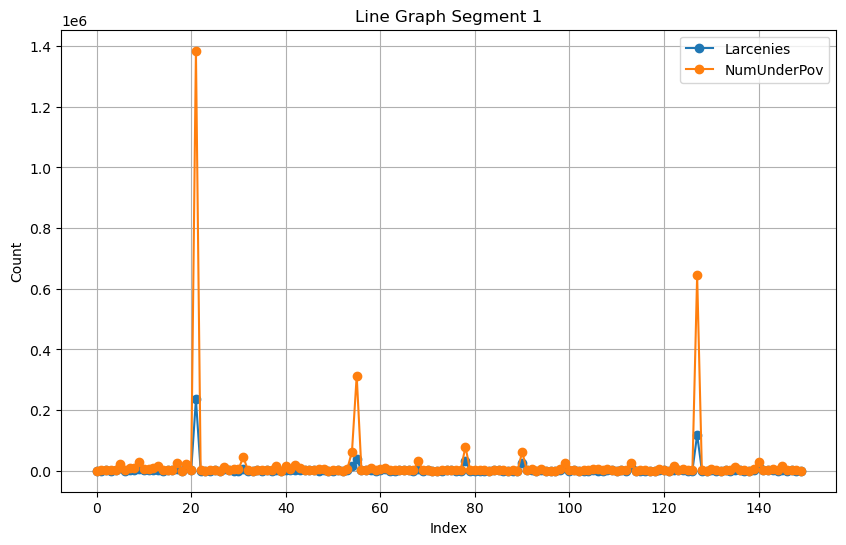

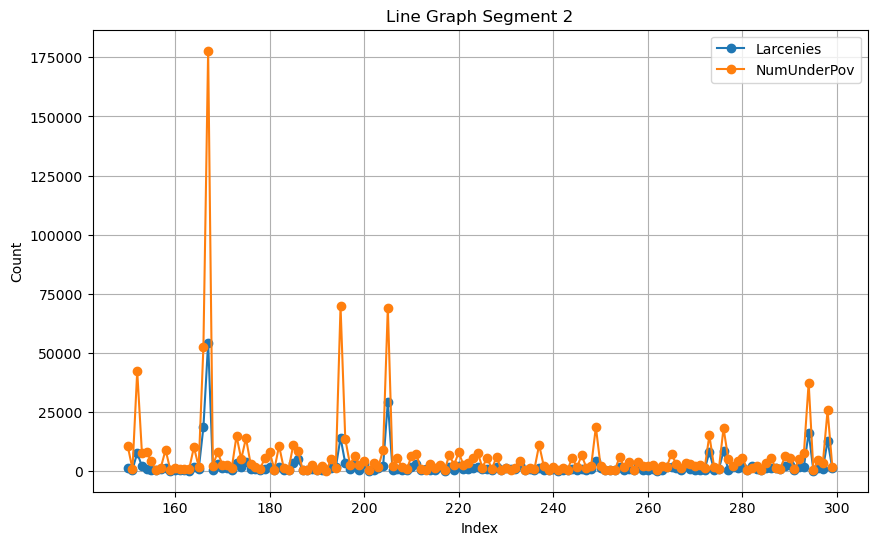

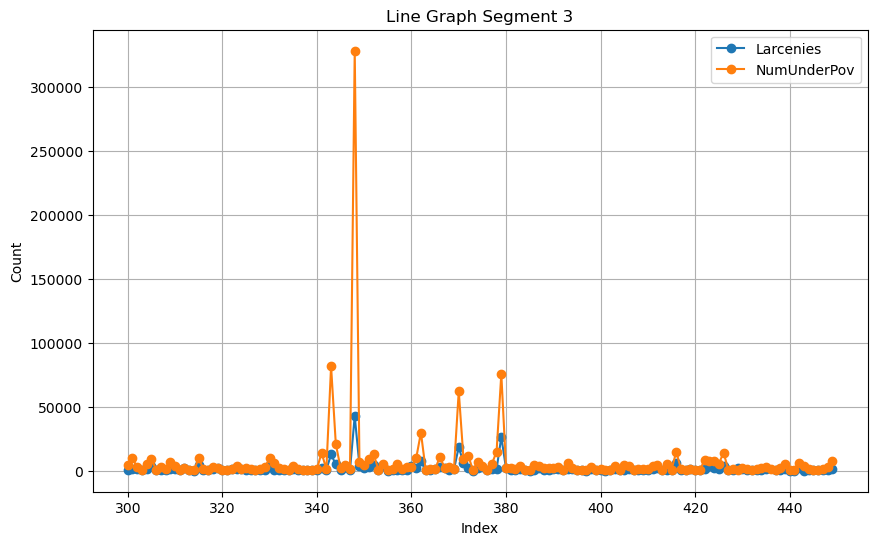

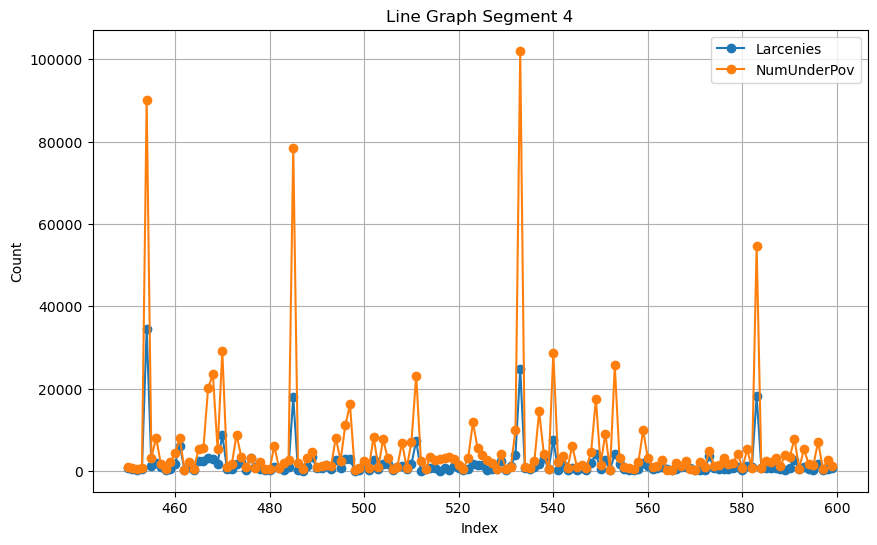

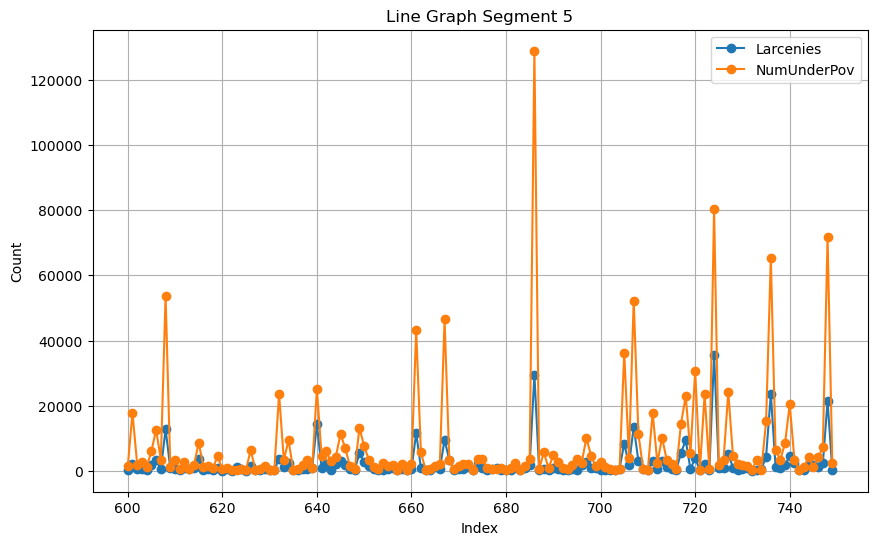

...

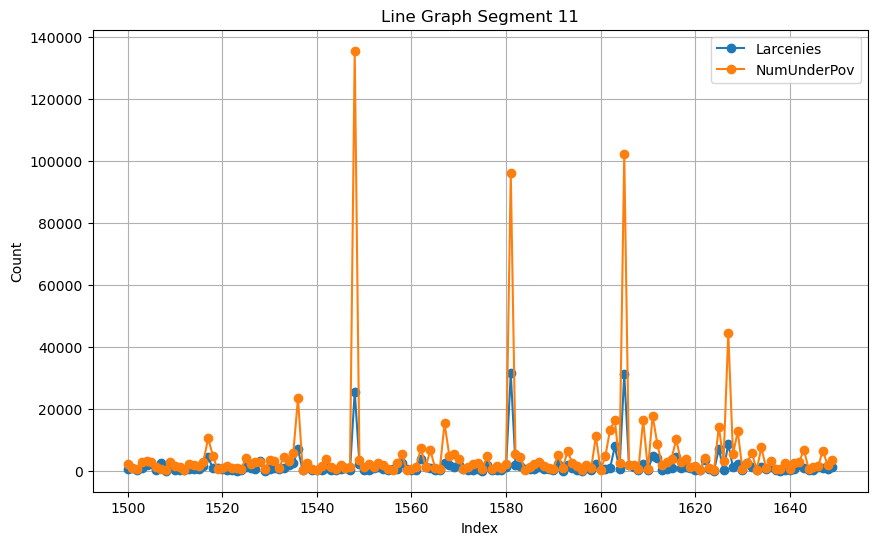

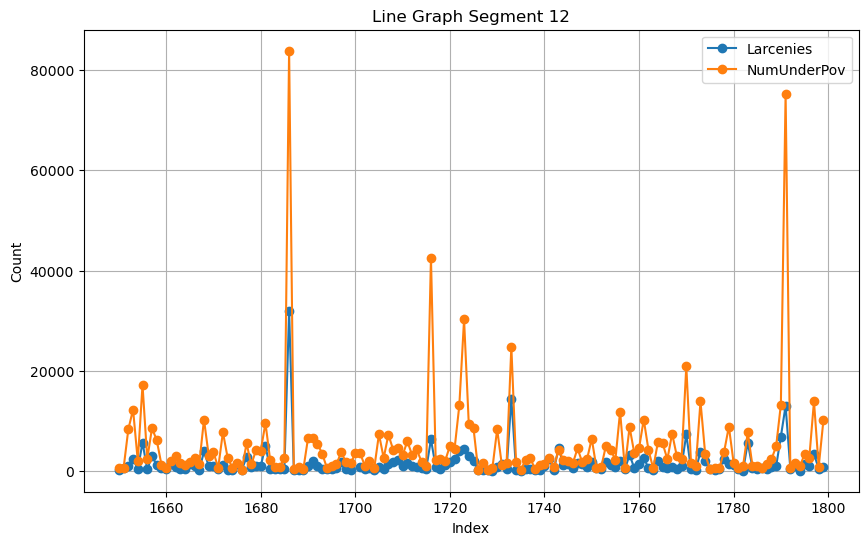

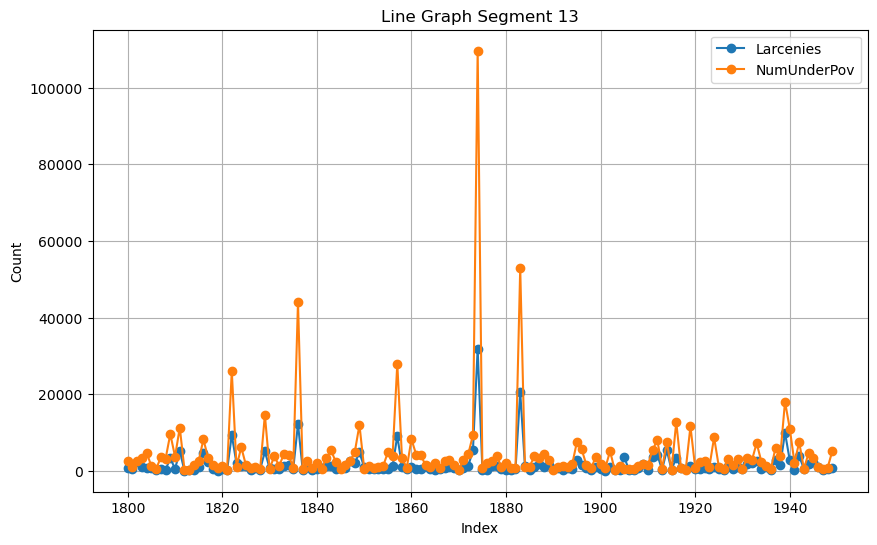

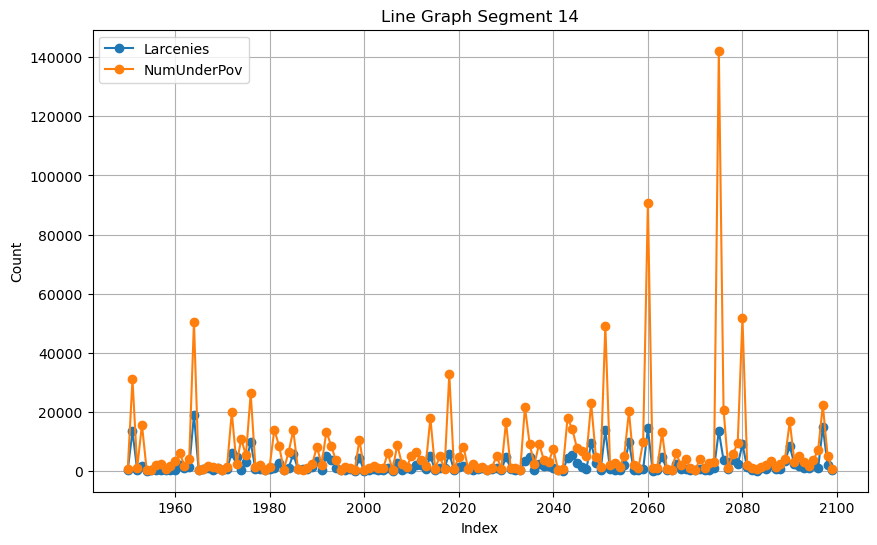

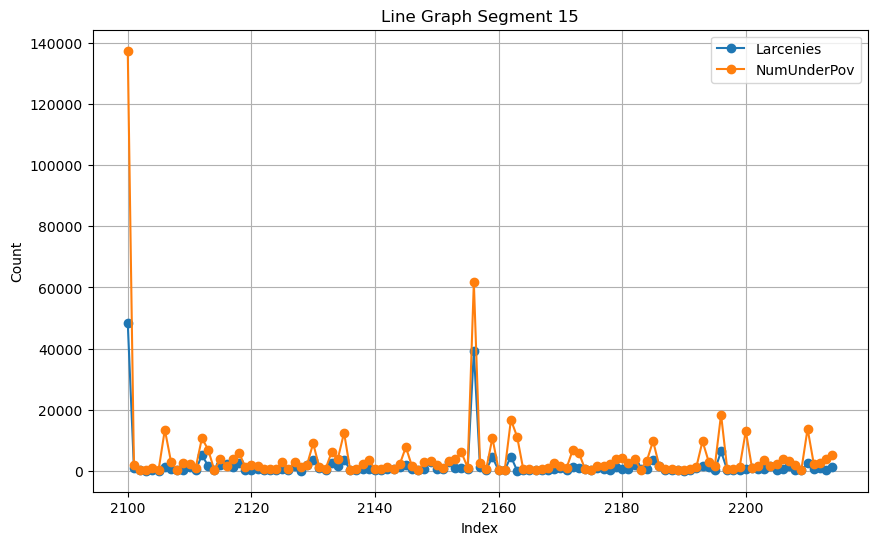

In [146]:
# Number of rows per segment
segment_size = 150

# Number of segments
num_segments = len(df_subset) // segment_size + (1 if len(df_subset) % segment_size != 0 else 0)

# Plot each segment
for i in range(num_segments):
    start_index = i * segment_size
    end_index = start_index + segment_size
    
    df_segment = df_subset.iloc[start_index:end_index]
    
    plt.figure(figsize=(10, 6))
    plt.plot(df_segment.index, df_segment['larcenies'], label='Larcenies', marker='o')
    plt.plot(df_segment.index, df_segment['NumUnderPov'], label='NumUnderPov', marker='o')
    
    plt.xlabel('Index')
    plt.ylabel('Count')
    plt.title(f'Line Graph Segment {i+1}')
    plt.legend()
    plt.grid(True)
    
    plt.show()

do again with pctlarcenies perpop and pctpopunderpov

do again with pop and larcenies

In [147]:
df_subset = df[['population','larcenies','larcPerPop','NumUnderPov','PctPopUnderPov']]
df_subset
# larcPerPop is per 100,000 people
# should we do larcpercentofpop?

,population,larcenies,larcPerPop,NumUnderPov,PctPopUnderPov
0,11980,138.0,1132.08,227,1.96
1,23123,376.0,1598.78,885,3.98
2,29344,1797.0,4972.19,1389,4.75
3,16656,716.0,4142.56,2831,17.23
4,11245,1060.0,8490.87,2855,29.99
...,...,...,...,...,...
2210,56216,2563.0,4225.82,13804,25.06
2211,12251,574.0,4748.90,2364,20.79
2212,32824,895.0,2435.97,2460,7.56
2213,13547,474.0,3722.90,4021,30.32


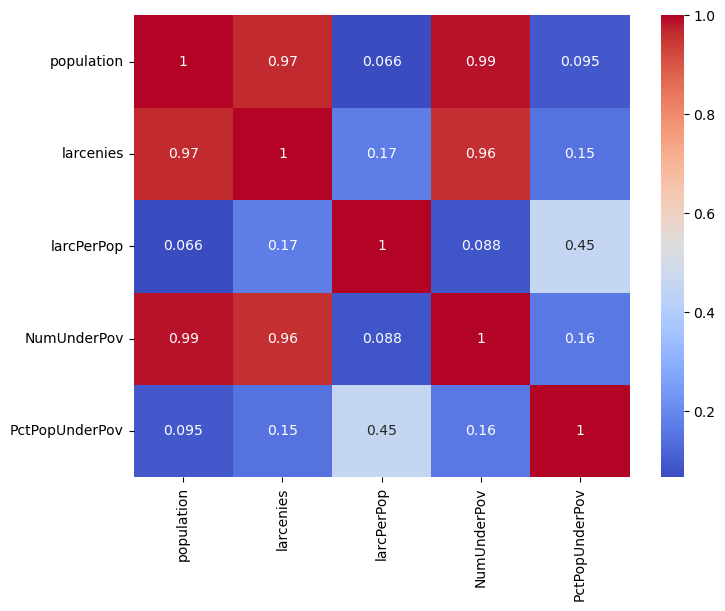

In [148]:
plt.figure(figsize=(8, 6))
sns.heatmap(df_subset.corr(), annot=True, cmap='coolwarm')
plt.show()

In [149]:
correlation_matrix = df.corr(numeric_only=True)
correlation_with_target = correlation_matrix['larcPerPop'].sort_values(ascending=False)
print(correlation_with_target.head(25))

larcPerPop             1.000000
nonViolPerPop          0.940969
burglPerPop            0.605452
TotalPctDiv            0.525430
MalePctDivorce         0.514272
FemalePctDiv           0.511725
rapesPerPop            0.511193
ViolentCrimesPerPop    0.509410
PctPopUnderPov         0.453399
PctHousNoPhone         0.452011
assaultPerPop          0.446264
robbbPerPop            0.422805
PctKidsBornNeverMar    0.409853
PctHousLess3BR         0.389333
autoTheftPerPop        0.362927
racepctblack           0.362778
pctWPubAsst            0.354361
murdPerPop             0.345551
arsonsPerPop           0.307609
PctUnemployed          0.294718
PctNotHSGrad           0.287944
PctImmigRec10          0.235031
PctVacantBoarded       0.226359
PctLess9thGrade        0.222559
LemasPctOfficDrugUn    0.215601
Name: larcPerPop, dtype: float64


## Outliers

In [151]:
df

,communityname,state,countyCode,communityCode,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,BerkeleyHeightstownship,NJ,39,5320,1,11980,3.10,1.37,91.78,6.50,...,14.0,114.85,138.0,1132.08,16.0,131.26,2.0,16.41,41.02,1394.59
1,Marpletownship,PA,45,47616,1,23123,2.82,0.80,95.57,3.44,...,57.0,242.37,376.0,1598.78,26.0,110.55,1.0,4.25,127.56,1955.95
2,Tigardcity,OR,NaN,NaN,1,29344,2.43,0.74,94.33,3.43,...,274.0,758.14,1797.0,4972.19,136.0,376.30,22.0,60.87,218.59,6167.51
3,Gloversvillecity,NY,35,29443,1,16656,2.40,1.70,97.35,0.50,...,225.0,1301.78,716.0,4142.56,47.0,271.93,NaN,NaN,306.64,NaN
4,Bemidjicity,MN,7,5068,1,11245,2.76,0.53,89.16,1.17,...,91.0,728.93,1060.0,8490.87,91.0,728.93,5.0,40.05,NaN,9988.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2210,Mercedcity,CA,NaN,NaN,10,56216,3.07,6.87,61.68,15.23,...,1376.0,2268.72,2563.0,4225.82,489.0,806.25,34.0,56.06,545.75,7356.84
2211,Pinevillecity,LA,NaN,NaN,10,12251,2.68,21.18,76.65,1.52,...,104.0,860.43,574.0,4748.90,24.0,198.56,2.0,16.55,124.10,5824.44
2212,Yucaipacity,CA,NaN,NaN,10,32824,2.46,0.52,92.62,0.98,...,628.0,1709.26,895.0,2435.97,179.0,487.19,8.0,21.77,353.83,4654.20
2213,Beevillecity,TX,NaN,NaN,10,13547,2.89,3.37,69.91,0.90,...,192.0,1508.01,474.0,3722.90,13.0,102.10,1.0,7.85,691.17,5340.87


In [152]:
df[['larcPerPop']].isnull().sum()

larcPerPop    3
dtype: int64

In [165]:
# Drop rows with missing values
dfo = df[['larcPerPop']].dropna()

In [154]:
dfo[['larcPerPop']].isnull().sum()

larcPerPop    0
dtype: int64

In [155]:
from sklearn.ensemble import IsolationForest

# Fit the model
iso_forest = IsolationForest(contamination=0.05)  # Assume 5% of data are outliers
dfo['outliers'] = iso_forest.fit_predict(dfo[['larcPerPop']])

# Filter the outliers (-1 is an outlier, 1 is normal)
outliers = dfo[dfo['outliers'] == -1]
print(outliers)


      larcPerPop  outliers
4        8490.87        -1
33        568.56        -1
109     19401.00        -1
113      7882.35        -1
136      7789.18        -1
...          ...       ...
2130     7163.62        -1
2156     7373.97        -1
2163      241.10        -1
2190      653.39        -1
2196     7982.35        -1

[109 rows x 2 columns]


In [156]:
num_outliers = (dfo['outliers'] == -1).sum()

print(f"Number of outliers: {num_outliers}")


Number of outliers: 109


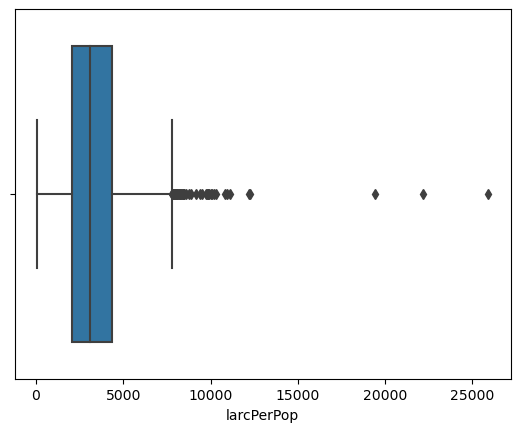

In [164]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a boxplot for a specific column
sns.boxplot(x=df['larcPerPop'])
plt.show()

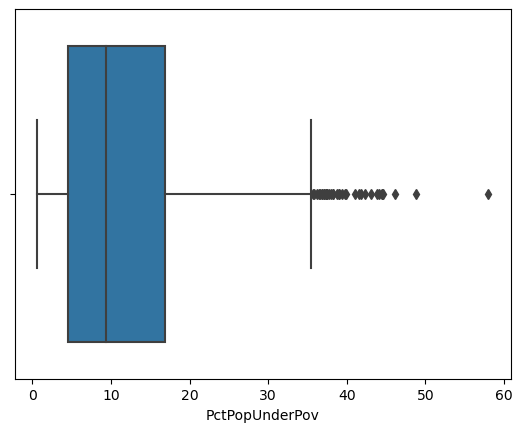

In [158]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a boxplot for a specific column
sns.boxplot(x=df['PctPopUnderPov'])
plt.show()

## Binning

In [150]:
for col in df.columns:
    print(f"{col}:\n {df[col].value_counts()}\n")  # prints bins in each column and number of items in each bin

 communityname:
 Auburncity            5
Greenvillecity        5
Jacksonvillecity      5
Springfieldcity       5
Albanycity            4
                     ..
Lackawannacity        1
LincolnParkborough    1
Keizercity            1
TarponSpringscity     1
WestSacramentocity    1
Name:  communityname, Length: 2018, dtype: int64

state:
 CA    279
NJ    211
TX    162
MA    123
OH    111
MI    108
PA    101
FL     90
CT     71
MN     66
WI     60
IN     48
NC     46
NY     46
AL     43
MO     42
WA     40
IL     40
GA     37
OK     36
TN     35
VA     33
OR     31
SC     28
RI     26
KY     26
CO     25
AR     25
UT     24
LA     22
NH     21
IA     20
MS     20
AZ     20
ME     17
WV     14
MD     12
NM     10
SD      9
ND      8
WY      7
ID      7
NV      5
VT      4
AK      3
KS      1
DE      1
DC      1
Name: state, dtype: int64

countyCode:
 3      78
17     63
9      45
7      40
1      40
       ..
690     1
800     1
770     1
750     1
193     1
Name: countyCode, Length: 114, 

Redo everything for pctLarcPerPop

To Do: 
-hot encode object type variables
-bin numerical variables
-check for and deal with outliers